# 7- Gradient Boosting Machines 

## TEORİ

**Zayıf öğrenicileri bir araya getirip güçlü bir öğrenici ortaya çıkarmak fikrine dayanır.**

* AdaBoost'un sınıflandırma ve regresyon problemlerine kolayca uyarlanabilen genelleştirilmiş versiyonudur.

AdaBoost: Zayıf sınıflandırıcıların bir araya gelerek güçlü bir sınıflandırıcı oluşturması fikrini hayata geçiren algoritmadır.

Özellikleri:
* Gradient Boosting tek bir tahminsel model formunda olan modeller serisi oluşturur.
* Seri içerisideki bir model, serideki bir önceki modelin tahmin artıklarının/hatalarının (residuals) üzerine kurularak (fit) oluşturulur.
* GBM diferansiyellenebilen herhangi bir kayıp fonksiyonunu optimize edebilen Gradient Descent algoritmasını kullanır.    

* Gradient Boosting Machines türleri:
    * Extreme Gradient Boosting
    * Light Gradient Boosting
    * CatBoost Gradient

## UYGULAMA

### Verisetinin İncelenmesi ve Manipüle Edilmesi

* Kullanılan Kütüphaneler

In [2]:
# Gerekli kütüphanelerin dahil edilmesi,
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from pandas import MultiIndex, Int64Index
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category = UserWarning)

* Verisetinin İncelenmesi

Verisetini [buradan](https://mrkizmaz-s3data.s3.eu-west-1.amazonaws.com/DataSets/Hitters.csv) indirebilirsiniz.

In [3]:
hit = pd.read_csv("https://mrkizmaz-s3data.s3.eu-west-1.amazonaws.com/DataSets/Hitters.csv")
df = hit.copy()
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.0,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.0,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.0,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.5,N


In [4]:
df.info() # veriseti hakkında bilgi verir

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322 entries, 0 to 321
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AtBat      322 non-null    int64  
 1   Hits       322 non-null    int64  
 2   HmRun      322 non-null    int64  
 3   Runs       322 non-null    int64  
 4   RBI        322 non-null    int64  
 5   Walks      322 non-null    int64  
 6   Years      322 non-null    int64  
 7   CAtBat     322 non-null    int64  
 8   CHits      322 non-null    int64  
 9   CHmRun     322 non-null    int64  
 10  CRuns      322 non-null    int64  
 11  CRBI       322 non-null    int64  
 12  CWalks     322 non-null    int64  
 13  League     322 non-null    object 
 14  Division   322 non-null    object 
 15  PutOuts    322 non-null    int64  
 16  Assists    322 non-null    int64  
 17  Errors     322 non-null    int64  
 18  Salary     263 non-null    float64
 19  NewLeague  322 non-null    object 
dtypes: float64

In [5]:
df.isnull().values.any() # verisetinde bos degerler var mı?

True

In [6]:
df = df.dropna(axis = 0) # verisetindeki bos degerlerin oldugu satırları siler

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 263 entries, 1 to 321
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AtBat      263 non-null    int64  
 1   Hits       263 non-null    int64  
 2   HmRun      263 non-null    int64  
 3   Runs       263 non-null    int64  
 4   RBI        263 non-null    int64  
 5   Walks      263 non-null    int64  
 6   Years      263 non-null    int64  
 7   CAtBat     263 non-null    int64  
 8   CHits      263 non-null    int64  
 9   CHmRun     263 non-null    int64  
 10  CRuns      263 non-null    int64  
 11  CRBI       263 non-null    int64  
 12  CWalks     263 non-null    int64  
 13  League     263 non-null    object 
 14  Division   263 non-null    object 
 15  PutOuts    263 non-null    int64  
 16  Assists    263 non-null    int64  
 17  Errors     263 non-null    int64  
 18  Salary     263 non-null    float64
 19  NewLeague  263 non-null    object 
dtypes: float64

In [8]:
df.nunique() # sütun bazında eşsiz degerlerin sayısı

AtBat        209
Hits         130
HmRun         35
Runs          92
RBI           94
Walks         87
Years         21
CAtBat       257
CHits        241
CHmRun       129
CRuns        226
CRBI         226
CWalks       207
League         2
Division       2
PutOuts      199
Assists      145
Errors        29
Salary       150
NewLeague      2
dtype: int64

In [9]:
df.describe().T # verisetinin istatistiksel dagılımı

,count,mean,std,min,25%,50%,75%,max
AtBat,263.0,403.642586,147.307209,19.0,282.5,413.0,526.0,687.0
Hits,263.0,107.828897,45.125326,1.0,71.5,103.0,141.5,238.0
HmRun,263.0,11.619772,8.757108,0.0,5.0,9.0,18.0,40.0
Runs,263.0,54.745247,25.539816,0.0,33.5,52.0,73.0,130.0
RBI,263.0,51.486692,25.882714,0.0,30.0,47.0,71.0,121.0
Walks,263.0,41.114068,21.718056,0.0,23.0,37.0,57.0,105.0
Years,263.0,7.311787,4.793616,1.0,4.0,6.0,10.0,24.0
CAtBat,263.0,2657.543726,2286.582929,19.0,842.5,1931.0,3890.5,14053.0
CHits,263.0,722.186312,648.199644,4.0,212.0,516.0,1054.0,4256.0
CHmRun,263.0,69.239544,82.197581,0.0,15.0,40.0,92.5,548.0


In [10]:
df.corr() # aralarındaki korelasyon degerleri

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary
AtBat,1.000000,0.963969,0.555102,0.899829,0.796015,0.624448,0.012725,0.207166,0.225341,0.212422,0.237278,0.221393,0.132926,0.309607,0.342117,0.325577,0.394771
Hits,0.963969,1.000000,0.530627,0.910630,0.788478,0.587311,0.018598,0.206678,0.235606,0.189364,0.238896,0.219384,0.122971,0.299688,0.303975,0.279876,0.438675
HmRun,0.555102,0.530627,1.000000,0.631076,0.849107,0.440454,0.113488,0.217464,0.217496,0.492526,0.258347,0.349858,0.227183,0.250931,-0.161602,-0.009743,0.343028
Runs,0.899829,0.910630,0.631076,1.000000,0.778692,0.697015,-0.011975,0.171811,0.191327,0.229701,0.237831,0.202335,0.163700,0.271160,0.179258,0.192609,0.419859
RBI,0.796015,0.788478,0.849107,0.778692,1.000000,0.569505,0.129668,0.278126,0.292137,0.442190,0.307226,0.387777,0.233619,0.312065,0.062902,0.150155,0.449457
Walks,0.624448,0.587311,0.440454,0.697015,0.569505,1.000000,0.134793,0.269450,0.270795,0.349582,0.332977,0.312697,0.429140,0.280855,0.102523,0.081937,0.443867
Years,0.012725,0.018598,0.113488,-0.011975,0.129668,0.134793,1.000000,0.915681,0.897844,0.722371,0.876649,0.863809,0.837524,-0.020019,-0.085118,-0.156512,0.400657
CAtBat,0.207166,0.206678,0.217464,0.171811,0.278126,0.269450,0.915681,1.000000,0.995057,0.801676,0.982747,0.950730,0.906712,0.053393,-0.007897,-0.070478,0.526135
CHits,0.225341,0.235606,0.217496,0.191327,0.292137,0.270795,0.897844,0.995057,1.000000,0.786652,0.984542,0.946797,0.890718,0.067348,-0.013144,-0.068036,0.548910
CHmRun,0.212422,0.189364,0.492526,0.229701,0.442190,0.349582,0.722371,0.801676,0.786652,1.000000,0.825625,0.927903,0.810878,0.093822,-0.188886,-0.165369,0.524931


In [11]:
# verisetindeki kategorik degiskenler sürekli degiskenlere cevrilmeli,
dummy = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
dummy.head()

,League_A,League_N,Division_E,Division_W,NewLeague_A,NewLeague_N
1,0,1,0,1,0,1
2,1,0,0,1,1,0
3,0,1,1,0,0,1
4,0,1,1,0,0,1
5,1,0,0,1,1,0


In [12]:
# kategorik degiskenler ana verisetinden silinmeli,
df1 = df.drop(['League', 'Division', 'NewLeague'], axis = 1)
df1.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,632,43,10,475.0
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,880,82,14,480.0
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,200,11,3,500.0
4,321,87,10,39,42,30,2,396,101,12,48,46,33,805,40,4,91.5
5,594,169,4,74,51,35,11,4408,1133,19,501,336,194,282,421,25,750.0


In [13]:
# dummy ve df1 birlestirerek güncel veriseti olusturulur,
df = pd.concat([df1, dummy[['League_N', 'Division_W', 'NewLeague_N']]], axis = 1)
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary,League_N,Division_W,NewLeague_N
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,632,43,10,475.0,1,1,1
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,880,82,14,480.0,0,1,0
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,200,11,3,500.0,1,0,1
4,321,87,10,39,42,30,2,396,101,12,48,46,33,805,40,4,91.5,1,0,1
5,594,169,4,74,51,35,11,4408,1133,19,501,336,194,282,421,25,750.0,0,1,0


In [14]:
# dummy ve df1 birlestirerek güncel veriseti olusturulur,
df = pd.concat([df1, dummy[['League_N', 'Division_W', 'NewLeague_N']]], axis = 1)
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary,League_N,Division_W,NewLeague_N
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,632,43,10,475.0,1,1,1
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,880,82,14,480.0,0,1,0
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,200,11,3,500.0,1,0,1
4,321,87,10,39,42,30,2,396,101,12,48,46,33,805,40,4,91.5,1,0,1
5,594,169,4,74,51,35,11,4408,1133,19,501,336,194,282,421,25,750.0,0,1,0


### Model Kurulumu

In [15]:
X = df.drop(['Salary'], axis =  1) # Salary dısındaki bagımsız degiskenler
y = df['Salary'] # bagımlı degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)

In [16]:
# modelin olusturulması ve fit edilmesi
gbm_model = GradientBoostingRegressor()
gbm_model = gbm_model.fit(X_train, y_train)
gbm_model

GradientBoostingRegressor()

In [17]:
rscore = gbm_model.score(X_train, y_train) # modelin basarı degeri

In [18]:
rscore # [önemli]

0.987566706391604

### Tahminleme

In [19]:
# modelin hata degeri,
y_pred = gbm_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [20]:
rmse # [önemli]

290.89218788112004

In [21]:
print(f"Modelin hata degeri: {rmse} ve basarı yüzdesi: {rscore * 100}")

Modelin hata degeri: 290.89218788112004 ve basarı yüzdesi: 98.7566706391604


### Model Tuning / Model Doğrulama

In [22]:
# optimum parametrelerin bulunması,
gbm_params = {'learning_rate': [0.001, 0.01, 0.1],
             'max_depth': [1, 3, 5],
             'n_estimators': [500, 1000, 2000],
             'subsample': [0.5, 0.75, 1]}

# ekstra degerler de girilirse model olusturulmasında islem uzun sürebilir!

In [23]:
# modelin olusturulması ve fit edilmesi
gbm_cv_model = GridSearchCV(gbm_model,
                            gbm_params,
                            cv = 10,
                            n_jobs = -1).fit(X_train, y_train)

gbm_cv_model # uzun sürebilir! (7-8 dk)

GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 3, 5],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [24]:
gbm_cv_model.best_params_ # optimum parametreler

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.75}

In [43]:
# final modelinin olusturulması ve optimum hata degerinin bulunması,
gbm_tuned = GradientBoostingRegressor(learning_rate = 0.01,
                                     max_depth = 3,
                                     n_estimators = 500,
                                     subsample = 0.75).fit(X_train, y_train)

In [44]:
rscore_tuned = gbm_tuned.score(X_train, y_train) # modelin basarı degeri

In [45]:
rscore_tuned # [önemli]

0.9555904092018848

In [46]:
ypred = gbm_tuned.predict(X_test)
rmse_tuned = np.sqrt(mean_squared_error(y_test, ypred))

In [47]:
rmse_tuned # [önemli]

289.54962544437126

In [48]:
print(f"Modelin optimum hata degeri: {rmse_tuned} ve basarı yüzdesi: {rscore_tuned * 100}")

Modelin optimum hata degeri: 289.54962544437126 ve basarı yüzdesi: 95.55904092018848


#### Değişkenlerin Önem Düzeyi

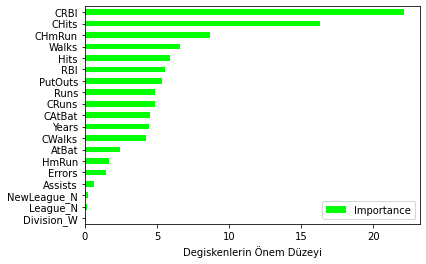

In [49]:
Importance = pd.DataFrame({'Importance': gbm_tuned.feature_importances_ * 100},
                         index = X_train.columns)

Importance.sort_values(by = "Importance",
                       axis = 0,
                       ascending = True).plot(kind = 'barh', color = 'lime')
plt.xlabel('Degiskenlerin Önem Düzeyi')
plt.legend(loc = 4);

## Extreme Gradient Boosting (XGBoost)

**XGBoost, GBM'in hız ve tahmin performansını artırmak üzere optimize edilmiş ölçeklenebilirlik ve farklı platformlara entegre edilebilir halidir.**

* Kaggle yarışmalarında çok kullanılır.
* Ölçeklenebilir ve hızlıdır.
* Tahmin başarısı yüksektir.

### Model Kurulumu

In [32]:
X = df.drop(['Salary'], axis =  1) # Salary dısındaki bagımsız degiskenler
y = df['Salary'] # bagımlı degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)

# xgboost veri yapısı kullanılırsa daha iyi performanslı olur.
DM_train = xgb.DMatrix(data = X_train, label = y_train)
DM_test = xgb.DMatrix(data = X_test, label = y_test)

In [33]:
# modelin olusturulması ve fit edilmesi,
xgb_model = xgb.XGBRegressor().fit(X_train, y_train)
xgb_model

XGBRegressor(base_score=0.5, booster=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints=None,
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method=None, validate_parameters=False, verbosity=None)

In [34]:
?xgb_model

Type:        XGBRegressor
String form:
XGBRegressor(base_score=0.5, booster=None, colsample_bylevel=1,
           colsample_bynode=1,  <...> _weight=1, subsample=1,
           tree_method=None, validate_parameters=False, verbosity=None)
File:        ~/.local/lib/python3.8/site-packages/xgboost/sklearn.py
Docstring:  
Implementation of the scikit-learn API for XGBoost regression.


Parameters
----------

    n_estimators : int
        Number of gradient boosted trees.  Equivalent to number of boosting
        rounds.

    max_depth : int
        Maximum tree depth for base learners.
    learning_rate : float
        Boosting learning rate (xgb's "eta")
    verbosity : int
        The degree of verbosity. Valid values are 0 (silent) - 3 (debug).
    objective : string or callable
        Specify the learning task and the corresponding learning objective or
        a custom objective function to be used (see note below).
    booster: string
        Specify which booster to use: gbtree, gb

In [35]:
rscore_xgb = xgb_model.score(X_train, y_train) # modelin basarı degeri

In [36]:
rscore_xgb # [önemli]

0.9999999998791571

### Tahminleme

In [37]:
# modelin hata degeri
ypred = xgb_model.predict(X_test)
rmse_xgb = np.sqrt(mean_squared_error(y_test, ypred))

In [38]:
rmse_xgb # [önemli]

298.061581312109

In [39]:
print(f"Modelin basarı yüzdesi: {rscore_xgb * 100} ve hata degeri: {rmse_xgb}")

Modelin basarı yüzdesi: 99.99999998791571 ve hata degeri: 298.061581312109


### Model Tuning / Model Doğrulama

In [40]:
# optimum parametrelerin bulunması
n_estimators = [500, 1000, 2000]
max_depth = [1, 3, 5]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.75, 1]
booster = ['gbtree','gblinear']

# base_score = [0.5 ,1]
# min_child_weight = [1, 2, 3]
# colsample_bytree = [0.4, 0.5,0.6, 0.9, 1]
# degerler artırılabilir, artırılırsa islemler uzun sürebilir.

xgb_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'subsample':subsample,
    'booster':booster}

In [41]:
xgb_model = xgb.XGBRegressor()
xgb_cv = GridSearchCV(xgb_model,
                      xgb_grid, 
                      cv = 10, 
                      n_jobs = -1).fit(X_train, y_train) # cok uzun sürebilir! (15-20 dk)

In [50]:
xgb_cv.best_params_ # optimum parametreler

{'booster': 'gbtree',
 'learning_rate': 0.1,
 'max_depth': 1,
 'n_estimators': 2000,
 'subsample': 0.75}

In [51]:
# final modeli ve hata degeri,
xgb_tuned = XGBRegressor(learning_rate = 0.1, 
                         max_depth = 1, 
                         n_estimators = 2000,
                         subsample = 0.75,
                         booster = 'gbtree') 

xgb_tuned = xgb_tuned.fit(X_train,y_train)

In [52]:
rscore_xgb_tuned = xgb_tuned.score(X_train, y_train) # modelin basarı degeri

In [53]:
rscore_xgb_tuned # [önemli]

0.9885035039277634

In [54]:
# optimum hata degerinin bulunması,
y_pred = xgb_tuned.predict(X_test)
rmse_tuned_xgb = np.sqrt(mean_squared_error(y_test, y_pred))

In [55]:
rmse_tuned_xgb # [önemli]

297.17826823044544

In [56]:
print(f"Modelin optimum hata degeri: {rmse_tuned_xgb} ve basarı yüzdesi: {rscore_xgb_tuned * 100}")

Modelin optimum hata degeri: 297.17826823044544 ve basarı yüzdesi: 98.85035039277635


## Light Gradient Boosting

**Light GBM, XGBost'un eğitim süresi performansını artırmaya yönelik geliştirilen bir diğer GBM türüdür.**

Özellikleri,
* Daha performanslı,
* Level-wise büyüme stratetiji yerine leaf-wise büyüme stratejisini uygular,
* Breadth-first search (genişlemesine arama) yerine depth-first search (derinlemesine arama) yöntemleri kullanılır.

### Model Kurulumu

In [57]:
X = df.drop(['Salary'], axis =  1) # Salary dısındaki bagımsız degiskenler
y = df['Salary'] # bagımlı degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)

In [58]:
# modelin olusturulması ve fit edilmesi
lgbm = LGBMRegressor()
lgbm_model = lgbm.fit(X_train, y_train)
lgbm_model

LGBMRegressor()

In [59]:
rscore_lgbm = lgbm.score(X_train, y_train) # model basarı degeri

In [60]:
rscore_lgbm # [önemli]

0.9290052946945542

### Tahminleme

In [61]:
# modelin hata degeri
y_pred = lgbm_model.predict(X_test)
rmse_lgbm = np.sqrt(mean_squared_error(y_test, y_pred))

In [62]:
rmse_lgbm # [önemli]

353.89197703728786

In [63]:
print(f"Modelin basarı yüzdesi: {rscore_lgbm * 100} ve hata degeri: {rmse_lgbm}")

Modelin basarı yüzdesi: 92.90052946945542 ve hata degeri: 353.89197703728786


### Model Tuning / Model Doğrulama

In [64]:
?lgbm_model

Type:           LGBMRegressor
String form:    LGBMRegressor()
File:           ~/.local/lib/python3.8/site-packages/lightgbm/sklearn.py
Docstring:      LightGBM regressor.
Init docstring:
Construct a gradient boosting model.

Parameters
----------
boosting_type : str, optional (default='gbdt')
    'gbdt', traditional Gradient Boosting Decision Tree.
    'dart', Dropouts meet Multiple Additive Regression Trees.
    'goss', Gradient-based One-Side Sampling.
    'rf', Random Forest.
num_leaves : int, optional (default=31)
    Maximum tree leaves for base learners.
max_depth : int, optional (default=-1)
    Maximum tree depth for base learners, <=0 means no limit.
learning_rate : float, optional (default=0.1)
    Boosting learning rate.
    You can use ``callbacks`` parameter of ``fit`` method to shrink/adapt learning rate
    in training using ``reset_parameter`` callback.
    Note, that this will ignore the ``learning_rate`` argument in training.
n_estimators : int, optional (default=100)

In [65]:
# optimum degerlerin bulunması
lgbm_grid = {
    'learning_rate': [0.001, 0.01, 0.1],
    'n_estimators': [500, 1000, 2000],
    'max_depth': [1, 3, 5],
    'subsample': [0.5, 0.75, 1]}

lgbm = LGBMRegressor()

In [66]:
lgbm_cv_model = GridSearchCV(lgbm, lgbm_grid, cv=10, n_jobs = -1)
lgbm_cv_model = lgbm_cv_model.fit(X_train, y_train) # uzun sürebilir! (4-5 dk)

In [67]:
lgbm_cv_model

GridSearchCV(cv=10, estimator=LGBMRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 3, 5],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [68]:
lgbm_cv_model.best_params_ # optimum parametreler

{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.5}

In [69]:
# final modelin olusturulması ve optimum hata degerinin bulunması,
lgbm_tuned = LGBMRegressor(learning_rate = 0.01,
                           max_depth = 5,
                           n_estimators = 500,
                           subsample = 0.5).fit(X_train, y_train)

ypred = lgbm_tuned.predict(X_test)
rmse_lgbm = np.sqrt(mean_squared_error(y_test, ypred)) # optimum hata degeri

In [70]:
rmse_lgbm # [önemli]

361.7822472211918

In [71]:
rscore_lgbm_tuned = lgbm_tuned.score(X_train, y_train) # modelin basarı degeri

In [72]:
rscore_lgbm_tuned # [önemli]

0.8516292337268183

In [73]:
print(f"Modelin optimum hata degeri: {rmse_lgbm} ve basarı yüzdesi: {rscore_lgbm_tuned * 100}")

Modelin optimum hata degeri: 361.7822472211918 ve basarı yüzdesi: 85.16292337268183


## Category Boosting (CatBoost)

**Kategorik değişkenler ile otomatik olarak mücadele edebilen hızlı, başarılı bir diğer GBM türüdür.**

* Kategorik değişken desteği
* Hızlı ve ölçeklenebilir GPU desteği
* Daha başarılı tahminler

### Model Kurulumu

In [75]:
X = df.drop(['Salary'], axis =  1) # Salary dısındaki bagımsız degiskenler
y = df['Salary'] # bagımlı degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)
# modelin olusturulması ve fit edilmesi
catb = CatBoostRegressor()
catb_model = catb.fit(X_train, y_train)
catb_model

Learning rate set to 0.031996
0:	learn: 448.0791031	total: 2.13ms	remaining: 2.13s
1:	learn: 441.5890442	total: 3.15ms	remaining: 1.57s
2:	learn: 436.0088107	total: 4.29ms	remaining: 1.42s
3:	learn: 429.0528122	total: 5.5ms	remaining: 1.37s
4:	learn: 422.3798200	total: 6.67ms	remaining: 1.33s
5:	learn: 416.5890397	total: 7.65ms	remaining: 1.27s
6:	learn: 410.4457773	total: 8.62ms	remaining: 1.22s
7:	learn: 404.5124863	total: 9.59ms	remaining: 1.19s
8:	learn: 398.0121521	total: 10.6ms	remaining: 1.16s
9:	learn: 392.6350767	total: 11.5ms	remaining: 1.14s
10:	learn: 387.1891887	total: 12.5ms	remaining: 1.12s
11:	learn: 382.0287991	total: 13.6ms	remaining: 1.12s
12:	learn: 376.4256755	total: 14.6ms	remaining: 1.1s
13:	learn: 372.1392807	total: 15.5ms	remaining: 1.09s
14:	learn: 368.0174231	total: 16.4ms	remaining: 1.08s
15:	learn: 363.3974628	total: 17.8ms	remaining: 1.1s
16:	learn: 358.8261472	total: 20.4ms	remaining: 1.18s
17:	learn: 354.6551521	total: 21.5ms	remaining: 1.17s
18:	learn: 

In [66]:
?catb_model

Type:           CatBoostRegressor
String form:    <catboost.core.CatBoostRegressor object at 0x7f3b38949310>
File:           ~/.local/lib/python3.8/site-packages/catboost/core.py
Docstring:     
Implementation of the scikit-learn API for CatBoost regression.

Parameters
----------
Like in CatBoostClassifier, except loss_function, classes_count, class_names and class_weights

loss_function : string, [default='RMSE']
    'RMSE'
    'MAE'
    'Quantile:alpha=value'
    'LogLinQuantile:alpha=value'
    'Poisson'
    'MAPE'
    'Lq:q=value'
    'SurvivalAft:dist=value;scale=value'
Init docstring:
Initialize the CatBoost.

Parameters
----------
params : dict
    Parameters for CatBoost.
    If  None, all params are set to their defaults.
    If  dict, overriding parameters present in dict.


In [76]:
rscore_catb = catb_model.score(X_train, y_train) # modelin basarı degeri

In [77]:
rscore_catb # [önemli]

0.9990550272611709

### Tahminleme

In [78]:
# hata degierinin bulunması,
y_pred = catb_model.predict(X_test)
rmse_catb = np.sqrt(mean_squared_error(y_test, y_pred))

In [79]:
rmse_catb # [önemli]

310.67398433281335

In [80]:
print(f"Modelin basarı yüzdesi: {rscore_catb * 100} ve hata degeri: {rmse_catb}")

Modelin basarı yüzdesi: 99.90550272611709 ve hata degeri: 310.67398433281335


### Model Tuning / Model Doğrulama

In [81]:
# optimum parametrelerin bulunması,
catb_grid = {
    'iterations': [500, 1000, 2000],
    'learning_rate': [0.001, 0.01, 0.1],
    'depth': [1, 3, 5]}

catb = CatBoostRegressor()
catb_cv_model = GridSearchCV(catb, catb_grid, cv = 5, n_jobs = -1)

In [82]:
catb_cv_model = catb_cv_model.fit(X_train, y_train) # cok uzun sürebilir! (45-60 dk)

0:	learn: 449.6823752	total: 46.3ms	remaining: 23.1s
1:	learn: 447.9570911	total: 46.4ms	remaining: 11.6s
2:	learn: 446.6089036	total: 46.5ms	remaining: 7.71s
3:	learn: 444.9848057	total: 46.6ms	remaining: 5.78s
4:	learn: 443.2858047	total: 46.8ms	remaining: 4.63s
5:	learn: 442.0221176	total: 46.9ms	remaining: 3.86s
6:	learn: 440.3982480	total: 47ms	remaining: 3.31s
7:	learn: 438.7435666	total: 47.1ms	remaining: 2.89s
8:	learn: 437.1790786	total: 47.2ms	remaining: 2.57s
9:	learn: 436.0132621	total: 47.4ms	remaining: 2.32s
10:	learn: 434.3842102	total: 47.5ms	remaining: 2.11s
11:	learn: 432.8569492	total: 47.6ms	remaining: 1.93s
12:	learn: 431.4304900	total: 47.7ms	remaining: 1.79s
13:	learn: 429.9003951	total: 47.8ms	remaining: 1.66s
14:	learn: 428.5001637	total: 47.9ms	remaining: 1.55s
15:	learn: 427.6263401	total: 48ms	remaining: 1.45s
16:	learn: 426.1627047	total: 48.1ms	remaining: 1.36s
17:	learn: 425.2807569	total: 48.2ms	remaining: 1.29s
18:	learn: 423.9906239	total: 48.2ms	remai

/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


1990:	learn: 45.2192565	total: 18.9s	remaining: 85.5ms
1991:	learn: 45.1559612	total: 18.9s	remaining: 76ms
1992:	learn: 45.1211486	total: 18.9s	remaining: 66.5ms
1993:	learn: 45.0500615	total: 18.9s	remaining: 57ms
1994:	learn: 44.9880150	total: 19s	remaining: 47.6ms
1995:	learn: 44.9197201	total: 19s	remaining: 38ms
1996:	learn: 44.9083134	total: 19s	remaining: 28.5ms
1997:	learn: 44.8359098	total: 19s	remaining: 19ms
1998:	learn: 44.7752120	total: 19s	remaining: 9.5ms
1999:	learn: 44.7643051	total: 19s	remaining: 0us


/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


1973:	learn: 0.0001671	total: 15.9s	remaining: 210ms
1974:	learn: 0.0001662	total: 15.9s	remaining: 201ms
1975:	learn: 0.0001644	total: 15.9s	remaining: 193ms
1976:	learn: 0.0001634	total: 15.9s	remaining: 185ms
1977:	learn: 0.0001626	total: 15.9s	remaining: 177ms
1978:	learn: 0.0001611	total: 15.9s	remaining: 169ms
1979:	learn: 0.0001602	total: 15.9s	remaining: 161ms
1980:	learn: 0.0001597	total: 15.9s	remaining: 153ms
1981:	learn: 0.0001592	total: 15.9s	remaining: 145ms
1982:	learn: 0.0001580	total: 15.9s	remaining: 137ms
1983:	learn: 0.0001578	total: 16s	remaining: 129ms
1984:	learn: 0.0001567	total: 16s	remaining: 121ms
1985:	learn: 0.0001563	total: 16s	remaining: 113ms
1986:	learn: 0.0001550	total: 16s	remaining: 105ms
1987:	learn: 0.0001545	total: 16s	remaining: 96.7ms
1988:	learn: 0.0001533	total: 16s	remaining: 88.6ms
1989:	learn: 0.0001530	total: 16s	remaining: 80.5ms
1990:	learn: 0.0001523	total: 16s	remaining: 72.5ms
1991:	learn: 0.0001510	total: 16s	remaining: 64.4ms
1992:	

/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


1930:	learn: 0.0006901	total: 15.3s	remaining: 546ms
1931:	learn: 0.0006844	total: 15.3s	remaining: 540ms
1932:	learn: 0.0006781	total: 15.3s	remaining: 532ms
1933:	learn: 0.0006739	total: 15.3s	remaining: 524ms
1934:	learn: 0.0006667	total: 15.4s	remaining: 516ms
1935:	learn: 0.0006659	total: 15.4s	remaining: 508ms
1936:	learn: 0.0006643	total: 15.4s	remaining: 500ms
1937:	learn: 0.0006616	total: 15.4s	remaining: 492ms
1938:	learn: 0.0006552	total: 15.4s	remaining: 484ms
1939:	learn: 0.0006508	total: 15.4s	remaining: 476ms
1940:	learn: 0.0006440	total: 15.4s	remaining: 468ms
1941:	learn: 0.0006403	total: 15.4s	remaining: 460ms
1942:	learn: 0.0006384	total: 15.5s	remaining: 453ms
1943:	learn: 0.0006357	total: 15.5s	remaining: 445ms
1944:	learn: 0.0006291	total: 15.5s	remaining: 437ms
1945:	learn: 0.0006250	total: 15.5s	remaining: 429ms
1946:	learn: 0.0006207	total: 15.5s	remaining: 421ms
1947:	learn: 0.0006197	total: 15.5s	remaining: 413ms
1948:	learn: 0.0006174	total: 15.5s	remaining:

/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


1884:	learn: 0.0005146	total: 16.6s	remaining: 1.01s
1885:	learn: 0.0005120	total: 16.6s	remaining: 1s
1886:	learn: 0.0005078	total: 16.6s	remaining: 996ms
1887:	learn: 0.0005071	total: 16.6s	remaining: 987ms
1888:	learn: 0.0005025	total: 16.7s	remaining: 979ms
1889:	learn: 0.0004990	total: 16.7s	remaining: 970ms
1890:	learn: 0.0004955	total: 16.7s	remaining: 963ms
1891:	learn: 0.0004906	total: 16.7s	remaining: 953ms
1892:	learn: 0.0004879	total: 16.7s	remaining: 944ms
1893:	learn: 0.0004871	total: 16.7s	remaining: 935ms
1894:	learn: 0.0004826	total: 16.7s	remaining: 926ms
1895:	learn: 0.0004798	total: 16.7s	remaining: 916ms
1896:	learn: 0.0004784	total: 16.7s	remaining: 907ms
1897:	learn: 0.0004728	total: 16.7s	remaining: 898ms
1898:	learn: 0.0004655	total: 16.7s	remaining: 889ms
1899:	learn: 0.0004601	total: 16.7s	remaining: 880ms
1900:	learn: 0.0004568	total: 16.7s	remaining: 870ms
1901:	learn: 0.0004548	total: 16.7s	remaining: 861ms
1902:	learn: 0.0004534	total: 16.7s	remaining: 85

/home/mrkizmaz/.local/lib/python3.8/site-packages/xgboost/compat.py:85: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [83]:
catb_cv_model.best_params_ # optimum parametreler

{'depth': 3, 'iterations': 2000, 'learning_rate': 0.01}

In [84]:
# final modelinin olsuturulması ve optimum hata degerinin bulunması
catb_tuned = CatBoostRegressor(iterations = 2000, 
                               learning_rate = 0.01, 
                               depth = 3)

catb_tuned = catb_tuned.fit(X_train,y_train)

0:	learn: 453.8722920	total: 518us	remaining: 1.04s
1:	learn: 451.8605639	total: 1.12ms	remaining: 1.12s
2:	learn: 449.6671304	total: 1.54ms	remaining: 1.02s
3:	learn: 447.3904151	total: 1.9ms	remaining: 946ms
4:	learn: 445.3114716	total: 6.72ms	remaining: 2.68s
5:	learn: 443.3311916	total: 7.33ms	remaining: 2.44s
6:	learn: 441.3050143	total: 7.75ms	remaining: 2.21s
7:	learn: 439.1473954	total: 8.18ms	remaining: 2.04s
8:	learn: 437.0661554	total: 8.56ms	remaining: 1.89s
9:	learn: 434.9813846	total: 9ms	remaining: 1.79s
10:	learn: 432.7463864	total: 9.36ms	remaining: 1.69s
11:	learn: 431.1324210	total: 9.72ms	remaining: 1.61s
12:	learn: 428.9593785	total: 10.1ms	remaining: 1.54s
13:	learn: 426.9348578	total: 10.7ms	remaining: 1.51s
14:	learn: 424.9206896	total: 11ms	remaining: 1.46s
15:	learn: 423.0137017	total: 11.4ms	remaining: 1.41s
16:	learn: 421.1169390	total: 11.7ms	remaining: 1.37s
17:	learn: 419.1846006	total: 12.1ms	remaining: 1.33s
18:	learn: 417.2539602	total: 12.4ms	remainin

In [85]:
rscore_catb_tuned = catb_tuned.score(X_train, y_train) # modelin basarı degeri

In [86]:
rscore_catb_tuned # [önemli]

0.9524660664104351

In [87]:
# optimum hata degeri
y_pred = catb_tuned.predict(X_test)
rmse_catb_tuned = np.sqrt(mean_squared_error(y_test, y_pred))

In [88]:
rmse_catb_tuned # [önemli]

293.2623456362662

In [89]:
print(f"Modelin optimum hata degeri: {rmse_catb_tuned} ve basarı yüzdesi: {rscore_catb_tuned * 100}")

Modelin optimum hata degeri: 293.2623456362662 ve basarı yüzdesi: 95.24660664104351


## SONUÇ

* Gradient Boosting Regression ile elde edilen,
    * Modelin optimum hata degeri: **289.54962544437126** ve basarı yüzdesi: 95.55904092018848
* Extreme Gradient Boosting Regression ile elde edilen,
    * Modelin optimum hata degeri: **297.17826823044544** ve basarı yüzdesi: 98.85035039277635
* Light Gradient Boosting Regression ile elde edilen,
    * Modelin optimum hata degeri: **361.7822472211918** ve basarı yüzdesi: 85.16292337268183 
* CatBoost Gradient Boosting Regression ile elde edilen,
    * Modelin optimum hata degeri: **293.2623456362662** ve basarı yüzdesi: 95.24660664104351